## Kelvin 波的物理直观与尺度

当在带旋转的浅水方程中引入地转效应（赤道附近常用 β-平面近似，f ≈ β y），在满足适当边界条件（岸边或赤道对称性）时，会出现 Kelvin 波解：

- Kelvin 波沿某一方向（例如东向）无横向速度梯度（或横向速度很小），由沿向地形或赤道约束使流场被约束在边界附近。
- 对应的相速度仍然是浅水速度 $c = \sqrt{gH}$ （此处 H 为等效深度），因为沿向的动量与自由面位移之间的线性关系与非旋转浅水方程相同。
- 纬向结构由旋转项与重力项共同决定，对赤道 Kelvin 波，基模的纬向结构近似为高斯，半宽尺度（陷波尺度，或赤道面振幅衰减尺度）为

$$L_d = \sqrt{\frac{c}{\beta}}. $$

实用解释：较大的 c（或小的 β）会产生更宽的陷波带；c 决定波向的传播速度，β（或 f 的梯度）决定旋转对纬向的约束强度。

Kelvin wave phase speed c = 31.321 m/s, trapping scale L_d = 1167.0 km


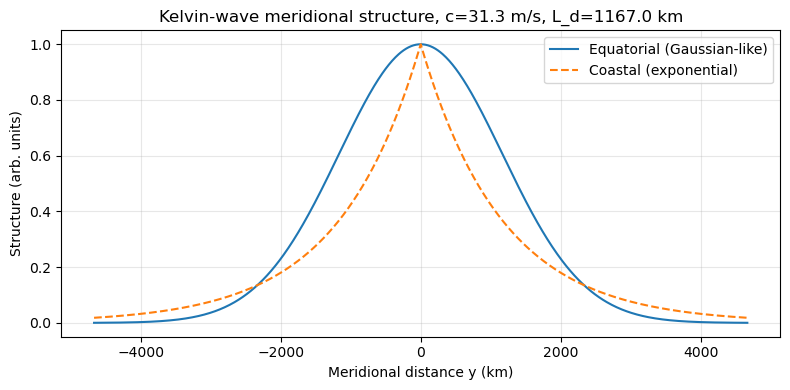

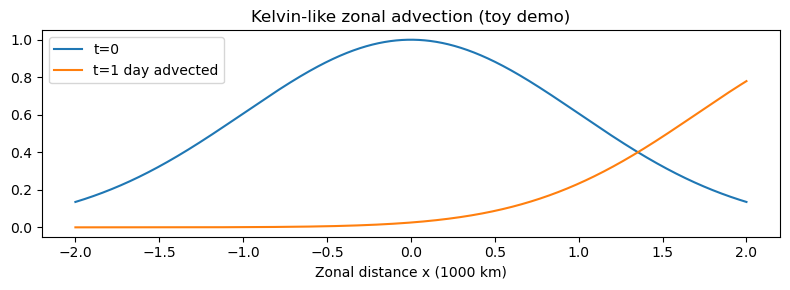

In [1]:
# Code example: Kelvin wave (equatorial/coastal illustration)

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Parameters
g = 9.81
H = 100.0
beta = 2.3e-11   # Typical beta near the equator

c = np.sqrt(g * H)
L_d = np.sqrt(c / beta)
print(f"Kelvin wave phase speed c = {c:.3f} m/s, trapping scale L_d = {L_d/1000:.1f} km")

# Meridional structure
y = np.linspace(-4 * L_d, 4 * L_d, 801)
phi_eq = np.exp(-0.5 * (y / L_d) ** 2)
phi_coast = np.exp(-np.abs(y) / L_d)

plt.figure(figsize=(8,4))
plt.plot(y/1000.0, phi_eq, label='Equatorial (Gaussian-like)')
plt.plot(y/1000.0, phi_coast, '--', label='Coastal (exponential)')
plt.xlabel('Meridional distance y (km)')
plt.ylabel('Structure (arb. units)')
plt.title(f'Kelvin-wave meridional structure, c={c:.1f} m/s, L_d={L_d/1000:.1f} km')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Simple zonal advection demo (1 day)
x = np.linspace(-2000e3, 2000e3, 2001)
sigma_x = 1e6
amp0 = np.exp(-0.5 * (x / sigma_x) ** 2)

t = 3600.0 * 24.0
amp_t = np.exp(-0.5 * ((x - c * t) / sigma_x) ** 2)

plt.figure(figsize=(8,3))
plt.plot(x/1e6, amp0, label='t=0')
plt.plot(x/1e6, amp_t, label='t=1 day advected')
plt.xlabel('Zonal distance x (1000 km)')
plt.title('Kelvin-like zonal advection (toy demo)')
plt.legend()
plt.tight_layout()
plt.show()

In [2]:
g = 9.81
h = 100.0
beta = 2.3e-11   # Typical beta near the equator
c = np.sqrt(g * h)
print(f"Kelvin wave phase speed c = {c:.3f} m/s")
R_e = np.sqrt(c / beta)
print(f"Kelvin wave trapping scale R_e = {R_e/1000:.1f} km")

Kelvin wave phase speed c = 31.321 m/s
Kelvin wave trapping scale R_e = 1167.0 km


In [3]:
# Animation: Kelvin wave 2D propagation (equatorial trapping)
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%matplotlib inline

# Parameters
g = 9.81
H = 100.0
beta = 2.3e-11
c = np.sqrt(g * H)
L_d = np.sqrt(c / beta)

# Spatial grid
x = np.linspace(-3000e3, 3000e3, 300)  # zonal (m)
y = np.linspace(-5*L_d, 5*L_d, 150)     # meridional (m)
X, Y = np.meshgrid(x, y)

# Initial wave packet parameters
sigma_x = 800e3
x0 = -1500e3  # initial position

# Time parameters
t_max = 10 * 24 * 3600.0  # 10 days
fps = 20
frames = 100

# Create figure
fig, ax = plt.subplots(figsize=(12, 5))
ax.set_xlabel('Zonal distance x (1000 km)')
ax.set_ylabel('Meridional distance y (1000 km)')
ax.set_title(f'Kelvin wave propagation animation (c = {c:.1f} m/s, L_d = {L_d/1000:.0f} km)')

# Initialize - use pcolormesh instead of contourf
im = ax.pcolormesh(X / 1e6, Y / 1e3, np.zeros_like(X), cmap='RdBu_r', vmin=-0.2, vmax=1.0, shading='auto')
plt.colorbar(im, ax=ax, label='Relative height')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes, fontsize=12, 
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

def animate(frame):
    t = frame * t_max / frames
    
    # Kelvin wave form: zonal Gaussian wave packet (propagating eastward), meridional Gaussian trapping
    eta = np.exp(-0.5 * ((X - x0 - c * t) / sigma_x) ** 2) * np.exp(-0.5 * (Y / L_d) ** 2)
    
    # Update color data
    im.set_array(eta.ravel())
    
    # Update time text
    time_text.set_text(f't = {t/(24*3600):.1f} days')
    
    return [im, time_text]

anim = FuncAnimation(fig, animate, frames=frames, interval=100, blit=False)
plt.close(fig)

# Display animation
HTML(anim.to_jshtml())

In [4]:
# Animation: Phase speed vs Group speed (dispersive deep-water wave example)
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%matplotlib inline

# Parameters
g = 9.81
k0 = 0.1  # central wavenumber (1/m)
dk = 0.02  # wave packet width (in wavenumber space)

# Deep-water dispersion relation: omega = sqrt(g*k)
omega0 = np.sqrt(g * k0)
c_phase = omega0 / k0       # phase speed
c_group = 0.5 * c_phase      # group speed = d(omega)/dk = g/(2*omega0) = c_phase/2

print(f"Deep-water wave: k0={k0:.3f} 1/m")
print(f"  Phase speed c_phase = {c_phase:.3f} m/s")
print(f"  Group speed c_group = {c_group:.3f} m/s")

# Space and time
x = np.linspace(-200, 400, 3001)
t_max = 40.0
frames = 80

# Create figure
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 7))

# Upper plot: waveform and markers
ax1.set_xlim(-200, 400)
ax1.set_ylim(-1.5, 1.5)
ax1.set_ylabel('η (m)')
ax1.set_title('Deep-water dispersive waves: phase speed (crests) vs group speed (envelope)')
ax1.grid(alpha=0.3)

line1, = ax1.plot([], [], 'b-', lw=1.5, label='wave')
envelope1_pos, = ax1.plot([], [], 'r--', lw=2, label='envelope (group speed)')
envelope1_neg, = ax1.plot([], [], 'r--', lw=2)
phase_mark1 = ax1.plot([], [], 'go', markersize=10, label='peak (phase speed)')[0]
group_mark1 = ax1.plot([], [], 'rs', markersize=10, label='envelope max')[0]
time_text1 = ax1.text(0.02, 0.95, '', transform=ax1.transAxes, fontsize=11, verticalalignment='top')
ax1.legend(loc='upper right')

# Lower plot: comparison with shallow-water non-dispersive wave
ax2.set_xlim(-200, 400)
ax2.set_ylim(-1.5, 1.5)
ax2.set_xlabel('x (m)')
ax2.set_ylabel('η (m)')
ax2.set_title('Shallow-water non-dispersive wave (c = sqrt(gh), no dispersion)')
ax2.grid(alpha=0.3)

line2, = ax2.plot([], [], 'b-', lw=1.5, label='wave')
peak_mark2 = ax2.plot([], [], 'go', markersize=10, label='peak')[0]
ax2.legend(loc='upper right')

# Formula annotations
ax1.text(0.98, 0.05, r'$\omega = \sqrt{gk}$' + '\n' + r'$c_g = \frac{1}{2}\sqrt{\frac{g}{k}} = \frac{1}{2}c_p$',
         transform=ax1.transAxes, fontsize=10, ha='right', va='bottom',
         bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
ax2.text(0.98, 0.05, r'$c = \sqrt{gh}$' + '\n(non-dispersive)',
         transform=ax2.transAxes, fontsize=10, ha='right', va='bottom',
         bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

# Shallow-water parameters for comparison
h_shallow = 10.0  # depth (m)
c_shallow = np.sqrt(g * h_shallow)

def compute_wave(x, t, dispersive=True):
    if dispersive:
        # Deep-water dispersive wave packet
        k = np.linspace(k0 - 3*dk, k0 + 3*dk, 101)
        omega = np.sqrt(g * k)
        
        # Superposition of multiple wave components
        eta = np.zeros_like(x)
        for ki, oi in zip(k, omega):
            weight = np.exp(-((ki - k0) / dk) ** 2)
            eta += weight * np.cos(ki * x - oi * t)
        eta /= np.sum(np.exp(-((k - k0) / dk) ** 2))  # normalize
        
        # Envelope: Gaussian modulated by group speed
        sigma = 2 * np.pi / dk
        envelope = np.exp(-((x - c_group * t) / sigma) ** 2)
        
        return eta, envelope
    else:
        # Shallow-water non-dispersive wave
        sigma = 2 * np.pi / dk
        eta = np.exp(-((x - c_shallow * t) / sigma) ** 2) * np.cos(k0 * x - k0 * c_shallow * t)
        return eta

def animate(frame):
    t = frame * t_max / frames
    
    # Deep-water dispersive wave
    eta1, env1 = compute_wave(x, t, dispersive=True)
    line1.set_data(x, eta1)
    envelope1_pos.set_data(x, env1)
    envelope1_neg.set_data(x, -env1)
    
    # Phase speed marker (track a specific crest)
    x_phase = c_phase * t
    if -200 <= x_phase <= 400:
        eta_at_phase = compute_wave(np.array([x_phase]), t, dispersive=True)[0][0]
        phase_mark1.set_data([x_phase], [eta_at_phase])
    else:
        phase_mark1.set_data([], [])
    
    # Group speed marker (track envelope maximum)
    x_group = c_group * t
    if -200 <= x_group <= 400:
        env_at_group = np.exp(-((x_group - c_group * t) / (2 * np.pi / dk)) ** 2)
        group_mark1.set_data([x_group], [env_at_group])
    else:
        group_mark1.set_data([], [])
    
    time_text1.set_text(f't = {t:.1f} s')
    
    # Shallow-water non-dispersive wave
    eta2 = compute_wave(x, t, dispersive=False)
    line2.set_data(x, eta2)
    
    # Peak marker
    x_peak = c_shallow * t
    if -200 <= x_peak <= 400:
        sigma = 2 * np.pi / dk
        eta_at_peak = np.exp(-((x_peak - c_shallow * t) / sigma) ** 2) * np.cos(k0 * x_peak - k0 * c_shallow * t)
        peak_mark2.set_data([x_peak], [eta_at_peak])
    else:
        peak_mark2.set_data([], [])
    
    return [line1, envelope1_pos, envelope1_neg, phase_mark1, group_mark1, time_text1, 
            line2, peak_mark2]

anim = FuncAnimation(fig, animate, frames=frames, interval=100, blit=False)
plt.close(fig)

# Display animation
HTML(anim.to_jshtml())

Deep-water wave: k0=0.100 1/m
  Phase speed c_phase = 9.905 m/s
  Group speed c_group = 4.952 m/s



For a Kelvin wave trapped along a boundary (coastal or equatorial), we need to understand:
1. How the decay condition in the cross-shore/meridional direction determines $\alpha$
2. How $\alpha$ relates to the phase speed $c_0$
3. How the sign of $c_0$ determines the propagation direction

---

### Step 1: Linearized Shallow Water Equations

Starting from the linearized shallow water equations on a β-plane (or f-plane for coastal Kelvin):

$$
\begin{aligned}
\frac{\partial u}{\partial t} - fv &= -g\frac{\partial \eta}{\partial x} \\
\frac{\partial v}{\partial t} + fu &= -g\frac{\partial \eta}{\partial y} \\
\frac{\partial \eta}{\partial t} + D\left(\frac{\partial u}{\partial x} + \frac{\partial v}{\partial y}\right) &= 0
\end{aligned}
$$

where:
- $(u, v)$ = velocity components in $(x, y)$ directions
- $\eta$ = surface displacement
- $f$ = Coriolis parameter (constant on f-plane)
- $g$ = gravitational acceleration
- $D$ = mean depth

---

### Step 2: Wave Solution Ansatz

Assume a wave solution of the form:

$$
\begin{aligned}
\eta(x,y,t) &= \hat{\eta}(y) e^{i(kx - \omega t)} \\
u(x,y,t) &= \hat{u}(y) e^{i(kx - \omega t)} \\
v(x,y,t) &= \hat{v}(y) e^{i(kx - \omega t)}
\end{aligned}
$$

where $\hat{\eta}(y)$, $\hat{u}(y)$, $\hat{v}(y)$ are functions of $y$ only.

---

### Step 3: Substitute into Equations

Substituting into the linearized equations and dividing by $e^{i(kx - \omega t)}$:

$$
\begin{aligned}
-i\omega \hat{u} - f\hat{v} &= -ikg\hat{\eta} \\
-i\omega \hat{v} + f\hat{u} &= -g\frac{d\hat{\eta}}{dy} \\
-i\omega \hat{\eta} + D\left(ik\hat{u} + \frac{d\hat{v}}{dy}\right) &= 0
\end{aligned}
$$

---

### Step 4: Kelvin Wave Solution (v = 0)

For a **Kelvin wave**, we impose $v = 0$ (no cross-shore/meridional velocity). From equation (2):

$$
f\hat{u} = -g\frac{d\hat{\eta}}{dy}
$$

From equation (1) with $\hat{v} = 0$:

$$
-i\omega \hat{u} = -ikg\hat{\eta} \quad \Rightarrow \quad \hat{u} = \frac{kg}{\omega}\hat{\eta} = \frac{g}{c_0}\hat{\eta}
$$

where we define the **phase speed** $c_0 \equiv \frac{\omega}{k}$.

---

### Step 5: Derive the ODE for $\hat{\eta}(y)$

Substitute $\hat{u} = \frac{g}{c_0}\hat{\eta}$ into $f\hat{u} = -g\frac{d\hat{\eta}}{dy}$:

$$
f \cdot \frac{g}{c_0}\hat{\eta} = -g\frac{d\hat{\eta}}{dy}
$$

Simplify:

$$
\frac{d\hat{\eta}}{dy} = -\frac{f}{c_0}\hat{\eta}
$$

This is a first-order ODE with solution:

$$
\hat{\eta}(y) = \eta_0 \exp\left(-\frac{f}{c_0}y\right)
$$

Define $\alpha \equiv \frac{f}{c_0}$, so:

$$
\boxed{\hat{\eta}(y) = \eta_0 e^{-\alpha y}}
$$

---

### Step 6: Boundary Condition - Decay Requirement

**Physical requirement**: The wave must decay away from the boundary to be physically realistic (finite energy).

**Case 1: Northern Hemisphere ($f > 0$), wave trapped at $y > 0$**

For the solution to decay as $y \to +\infty$, we need:

$$
e^{-\alpha y} \to 0 \quad \text{as } y \to +\infty
$$

This requires $\alpha > 0$:

$$
\alpha = \frac{f}{c_0} > 0
$$

Since $f > 0$ (Northern Hemisphere), we must have:

$$
\boxed{c_0 > 0} \quad \text{(wave propagates in +x direction)}
$$

**Case 2: Wave trapped at $y < 0$ (southern side of boundary)**

For decay as $y \to -\infty$, we write $\hat{\eta}(y) = \eta_0 e^{+\alpha y}$ (or equivalently $e^{-\alpha|y|}$).

This requires:

$$
\alpha = \frac{f}{c_0} > 0 \quad \text{but} \quad y < 0
$$

To have $e^{+\alpha y} \to 0$ as $y \to -\infty$ with $\alpha > 0$, we need:

$$
\boxed{c_0 < 0} \quad \text{(wave propagates in -x direction)}
$$

---

### Step 7: Connection to Dispersion Relation

From the continuity equation (3) with $v = 0$ and $\hat{u} = \frac{g}{c_0}\hat{\eta}$:

$$
-i\omega \hat{\eta} + Dik\hat{u} = 0
$$

$$
\omega \hat{\eta} = Dk \cdot \frac{g}{c_0}\hat{\eta}
$$

$$
\omega = \frac{Dkg}{c_0} = \frac{Dkg^2}{\omega/k} \cdot \frac{k}{\omega}
$$

Simplify:

$$
\omega^2 = Dgk^2 \quad \Rightarrow \quad \omega = \pm k\sqrt{gD}
$$

The dispersion relation is:

$$
\boxed{c_0 = \frac{\omega}{k} = \pm\sqrt{gD}}
$$

The **choice of sign** is determined by the **decay condition**:
- $c_0 = +\sqrt{gD}$: wave propagates eastward/right ($k > 0$)
- $c_0 = -\sqrt{gD}$: wave propagates westward/left ($k < 0$)

---

### Summary Table

| Location | Hemisphere | Decay Direction | Sign of $\alpha$ | Sign of $c_0$ | Propagation |
|----------|------------|-----------------|------------------|---------------|-------------|
| $y > 0$ | North ($f > 0$) | $y \to +\infty$ | $\alpha = \frac{f}{c_0} > 0$ | $c_0 > 0$ | **Eastward** (+x) |
| $y < 0$ | North ($f > 0$) | $y \to -\infty$ | $\alpha = \frac{f}{c_0} > 0$ | $c_0 < 0$ | **Westward** (-x) |
| $y > 0$ | South ($f < 0$) | $y \to +\infty$ | $\alpha = \frac{f}{c_0} > 0$ | $c_0 < 0$ | **Westward** (-x) |
| $y < 0$ | South ($f < 0$) | $y \to -\infty$ | $\alpha = \frac{f}{c_0} > 0$ | $c_0 > 0$ | **Eastward** (+x) |

---

### Physical Interpretation

1. **Decay requirement** ($\alpha > 0$): Ensures wave energy is localized near the boundary
2. **Geostrophic balance**: The along-shore velocity $u$ and surface displacement $\eta$ are in geostrophic balance with the Coriolis force
3. **No cross-shore flow** ($v = 0$): Satisfied automatically due to the boundary condition
4. **Propagation direction**: The sign of $c_0$ (determined by decay) tells us whether the wave travels with or against the positive x-direction

KELVIN WAVE: BOUNDARY CONDITIONS AND PROPAGATION DIRECTION

Physical Parameters:
  Gravitational acceleration g = 9.81 m/s²
  Mean depth D = 100.0 m
  Phase speed magnitude c₀ = √(gD) = 31.32 m/s
  Coriolis parameter f = 1.0e-04 s⁻¹ (Northern Hemisphere)
  Decay scale α = f/c₀ = 3.19e-06 m⁻¹
  e-folding distance L = 1/α = 313 km


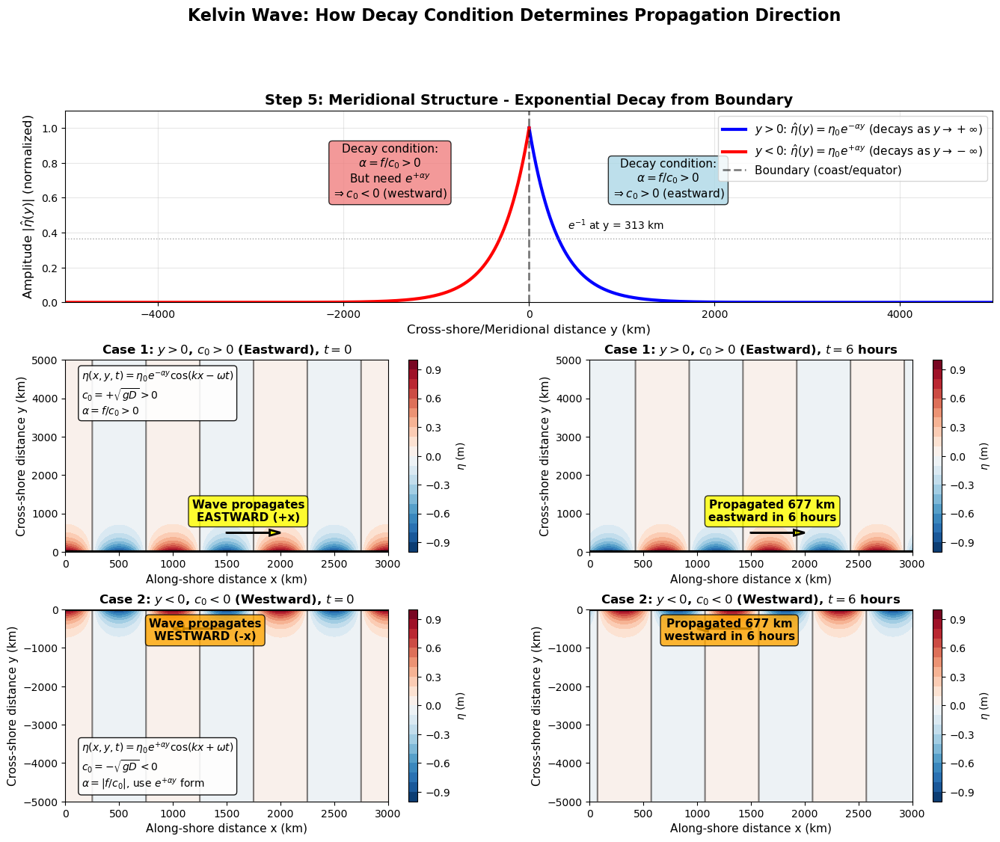


KEY RESULTS:

1. DECAY CONDITION determines α:
   - For physical solution: α = f/c₀ must give decay away from boundary
   - In Northern Hemisphere (f > 0): requires proper choice of c₀ sign
   - Decay scale: L = 1/α = 313 km

2. BOUNDARY LOCATION determines c₀ sign:
   - Wave at y > 0: needs exp(-αy) → c₀ = +√(gD) = +31.32 m/s (EASTWARD)
   - Wave at y < 0: needs exp(+αy) → c₀ = -√(gD) = -31.32 m/s (WESTWARD)

3. DISPERSION RELATION:
   - ω = ±k√(gD)
   - Phase speed: c₀ = ω/k = ±√(gD)
   - Sign chosen by decay requirement!

4. PHYSICAL INTERPRETATION:
   - Kelvin wave 'hugs' the boundary (coast or equator)
   - Amplitude decays exponentially away from boundary
   - Can only propagate in ONE direction along boundary
   - Direction determined by which side of boundary wave is on

5. EQUATORIAL APPLICATION:
   - Equatorial Kelvin wave: trapped at y=0 (equator)
   - Symmetric decay: exp(-α|y|) on both sides
   - Always propagates EASTWARD (c₀ > 0)
   - Critical for MJO, ENSO, intraseason

In [5]:
# Visualization: Kelvin Wave Decay and Propagation Direction
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, FancyArrowPatch
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Parameters
g = 9.81
D = 100.0  # depth (m)
f_north = 1e-4  # Northern Hemisphere Coriolis parameter
c0 = np.sqrt(g * D)  # phase speed magnitude
k = 2 * np.pi / 1000e3  # wavenumber (wavelength ~ 1000 km)
alpha = f_north / c0  # decay scale

# Spatial grids
y_pos = np.linspace(0, 5000e3, 1000)  # y > 0 (northern side)
y_neg = np.linspace(-5000e3, 0, 1000)  # y < 0 (southern side)
x = np.linspace(0, 3000e3, 500)
X_pos, Y_pos = np.meshgrid(x, y_pos)
X_neg, Y_neg = np.meshgrid(x, y_neg)

# Time snapshots
t1, t2 = 0, 3600 * 6  # 0 and 6 hours

print("="*70)
print("KELVIN WAVE: BOUNDARY CONDITIONS AND PROPAGATION DIRECTION")
print("="*70)
print(f"\nPhysical Parameters:")
print(f"  Gravitational acceleration g = {g} m/s²")
print(f"  Mean depth D = {D} m")
print(f"  Phase speed magnitude c₀ = √(gD) = {c0:.2f} m/s")
print(f"  Coriolis parameter f = {f_north:.1e} s⁻¹ (Northern Hemisphere)")
print(f"  Decay scale α = f/c₀ = {alpha:.2e} m⁻¹")
print(f"  e-folding distance L = 1/α = {1/alpha/1000:.0f} km")

# Create figure with 4 panels
fig = plt.figure(figsize=(16, 12))
gs = fig.add_gridspec(3, 2, hspace=0.3, wspace=0.3)

# =============================================================================
# Panel 1: Exponential decay profiles (y > 0 vs y < 0)
# =============================================================================
ax1 = fig.add_subplot(gs[0, :])

# Case 1: y > 0, c0 > 0 (eastward propagation)
eta_profile_pos = np.exp(-alpha * y_pos)

# Case 2: y < 0, c0 < 0 (westward propagation, need positive decay)
# For y < 0, we use exp(+α*y) which decays as y → -∞
eta_profile_neg = np.exp(alpha * y_neg)

ax1.plot(y_pos / 1000, eta_profile_pos, 'b-', lw=3, label='$y > 0$: $\\hat{\\eta}(y) = \\eta_0 e^{-\\alpha y}$ (decays as $y \\to +\\infty$)')
ax1.plot(y_neg / 1000, eta_profile_neg, 'r-', lw=3, label='$y < 0$: $\\hat{\\eta}(y) = \\eta_0 e^{+\\alpha y}$ (decays as $y \\to -\\infty$)')
ax1.axvline(0, color='k', lw=2, linestyle='--', alpha=0.5, label='Boundary (coast/equator)')
ax1.axhline(np.exp(-1), color='gray', lw=1, linestyle=':', alpha=0.7)
ax1.text(1/alpha/1000 + 100, np.exp(-1) + 0.05, f'$e^{{-1}}$ at y = {1/alpha/1000:.0f} km', fontsize=10)

ax1.set_xlabel('Cross-shore/Meridional distance y (km)', fontsize=12)
ax1.set_ylabel('Amplitude $|\\hat{\\eta}(y)|$ (normalized)', fontsize=12)
ax1.set_title('Step 5: Meridional Structure - Exponential Decay from Boundary', fontsize=14, fontweight='bold')
ax1.legend(fontsize=11, loc='upper right')
ax1.grid(alpha=0.3)
ax1.set_xlim([-5000, 5000])
ax1.set_ylim([0, 1.1])

# Add annotations
ax1.annotate('Decay condition:\n$\\alpha = f/c_0 > 0$\n$\\Rightarrow c_0 > 0$ (eastward)', 
             xy=(1500, 0.6), fontsize=11, ha='center',
             bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
ax1.annotate('Decay condition:\n$\\alpha = f/c_0 > 0$\nBut need $e^{+\\alpha y}$\n$\\Rightarrow c_0 < 0$ (westward)', 
             xy=(-1500, 0.6), fontsize=11, ha='center',
             bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.8))

# =============================================================================
# Panel 2: Case 1 - y > 0, Eastward propagation (c0 > 0)
# =============================================================================
ax2 = fig.add_subplot(gs[1, 0])

# Wave at t=0
omega = k * c0  # c0 > 0 for eastward
eta1_t0 = np.exp(-alpha * Y_pos) * np.cos(k * X_pos)
eta1_t1 = np.exp(-alpha * Y_pos) * np.cos(k * X_pos - omega * t2)

# Plot t=0
contour1 = ax2.contourf(X_pos / 1000, Y_pos / 1000, eta1_t0, levels=20, cmap='RdBu_r', vmin=-1, vmax=1)
ax2.contour(X_pos / 1000, Y_pos / 1000, eta1_t0, levels=[0], colors='k', linewidths=1.5, alpha=0.5)
ax2.axhline(0, color='k', lw=3, label='Boundary (y=0)')
ax2.arrow(1500, 500, 400, 0, head_width=150, head_length=100, fc='yellow', ec='black', lw=2)
ax2.text(1700, 800, 'Wave propagates\nEASTWARD (+x)', fontsize=11, ha='center', fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8))

ax2.set_xlabel('Along-shore distance x (km)', fontsize=11)
ax2.set_ylabel('Cross-shore distance y (km)', fontsize=11)
ax2.set_title('Case 1: $y > 0$, $c_0 > 0$ (Eastward), $t = 0$', fontsize=12, fontweight='bold')
ax2.set_xlim([0, 3000])
ax2.set_ylim([0, 5000])
plt.colorbar(contour1, ax=ax2, label='$\\eta$ (m)')

# Add equation box
ax2.text(0.05, 0.95, '$\\eta(x,y,t) = \\eta_0 e^{-\\alpha y}\\cos(kx - \\omega t)$\n$c_0 = +\\sqrt{gD} > 0$\n$\\alpha = f/c_0 > 0$',
         transform=ax2.transAxes, fontsize=10, va='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))

# =============================================================================
# Panel 3: Case 1 - y > 0, Eastward propagation at t = 6 hours
# =============================================================================
ax3 = fig.add_subplot(gs[1, 1])

contour2 = ax3.contourf(X_pos / 1000, Y_pos / 1000, eta1_t1, levels=20, cmap='RdBu_r', vmin=-1, vmax=1)
ax3.contour(X_pos / 1000, Y_pos / 1000, eta1_t1, levels=[0], colors='k', linewidths=1.5, alpha=0.5)
ax3.axhline(0, color='k', lw=3, label='Boundary (y=0)')

# Show displacement
x_displacement = c0 * t2 / 1000  # in km
ax3.arrow(1500, 500, 400, 0, head_width=150, head_length=100, fc='yellow', ec='black', lw=2)
ax3.text(1700, 800, f'Propagated {x_displacement:.0f} km\neastward in 6 hours', fontsize=11, ha='center', fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8))

ax3.set_xlabel('Along-shore distance x (km)', fontsize=11)
ax3.set_ylabel('Cross-shore distance y (km)', fontsize=11)
ax3.set_title(f'Case 1: $y > 0$, $c_0 > 0$ (Eastward), $t = {t2/3600:.0f}$ hours', fontsize=12, fontweight='bold')
ax3.set_xlim([0, 3000])
ax3.set_ylim([0, 5000])
plt.colorbar(contour2, ax=ax3, label='$\\eta$ (m)')

# =============================================================================
# Panel 4: Case 2 - y < 0, Westward propagation (c0 < 0)
# =============================================================================
ax4 = fig.add_subplot(gs[2, 0])

# Wave at t=0, c0 < 0 (westward)
omega_neg = k * c0  # note: we'll adjust the phase for westward
eta2_t0 = np.exp(alpha * Y_neg) * np.cos(k * X_neg)  # exp(+α*y) for y < 0
eta2_t1 = np.exp(alpha * Y_neg) * np.cos(k * X_neg + omega_neg * t2)  # note: +ωt for westward

contour3 = ax4.contourf(X_neg / 1000, Y_neg / 1000, eta2_t0, levels=20, cmap='RdBu_r', vmin=-1, vmax=1)
ax4.contour(X_neg / 1000, Y_neg / 1000, eta2_t0, levels=[0], colors='k', linewidths=1.5, alpha=0.5)
ax4.axhline(0, color='k', lw=3, label='Boundary (y=0)')
ax4.arrow(1500, -500, -400, 0, head_width=150, head_length=100, fc='orange', ec='black', lw=2)
ax4.text(1300, -800, 'Wave propagates\nWESTWARD (-x)', fontsize=11, ha='center', fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='orange', alpha=0.8))

ax4.set_xlabel('Along-shore distance x (km)', fontsize=11)
ax4.set_ylabel('Cross-shore distance y (km)', fontsize=11)
ax4.set_title('Case 2: $y < 0$, $c_0 < 0$ (Westward), $t = 0$', fontsize=12, fontweight='bold')
ax4.set_xlim([0, 3000])
ax4.set_ylim([-5000, 0])
plt.colorbar(contour3, ax=ax4, label='$\\eta$ (m)')

# Add equation box
ax4.text(0.05, 0.05, '$\\eta(x,y,t) = \\eta_0 e^{+\\alpha y}\\cos(kx + \\omega t)$\n$c_0 = -\\sqrt{gD} < 0$\n$\\alpha = |f/c_0|$, use $e^{+\\alpha y}$ form',
         transform=ax4.transAxes, fontsize=10, va='bottom',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))

# =============================================================================
# Panel 5: Case 2 - y < 0, Westward propagation at t = 6 hours
# =============================================================================
ax5 = fig.add_subplot(gs[2, 1])

contour4 = ax5.contourf(X_neg / 1000, Y_neg / 1000, eta2_t1, levels=20, cmap='RdBu_r', vmin=-1, vmax=1)
ax5.contour(X_neg / 1000, Y_neg / 1000, eta2_t1, levels=[0], colors='k', linewidths=1.5, alpha=0.5)
ax5.axhline(0, color='k', lw=3, label='Boundary (y=0)')

ax5.arrow(1500, -500, -400, 0, head_width=150, head_length=100, fc='orange', ec='black', lw=2)
ax5.text(1300, -800, f'Propagated {x_displacement:.0f} km\nwestward in 6 hours', fontsize=11, ha='center', fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='orange', alpha=0.8))

ax5.set_xlabel('Along-shore distance x (km)', fontsize=11)
ax5.set_ylabel('Cross-shore distance y (km)', fontsize=11)
ax5.set_title(f'Case 2: $y < 0$, $c_0 < 0$ (Westward), $t = {t2/3600:.0f}$ hours', fontsize=12, fontweight='bold')
ax5.set_xlim([0, 3000])
ax5.set_ylim([-5000, 0])
plt.colorbar(contour4, ax=ax5, label='$\\eta$ (m)')

plt.suptitle('Kelvin Wave: How Decay Condition Determines Propagation Direction', 
             fontsize=16, fontweight='bold', y=0.995)

plt.show()

# =============================================================================
# Summary printout
# =============================================================================
print("\n" + "="*70)
print("KEY RESULTS:")
print("="*70)
print("\n1. DECAY CONDITION determines α:")
print(f"   - For physical solution: α = f/c₀ must give decay away from boundary")
print(f"   - In Northern Hemisphere (f > 0): requires proper choice of c₀ sign")
print(f"   - Decay scale: L = 1/α = {1/alpha/1000:.0f} km")

print("\n2. BOUNDARY LOCATION determines c₀ sign:")
print(f"   - Wave at y > 0: needs exp(-αy) → c₀ = +√(gD) = +{c0:.2f} m/s (EASTWARD)")
print(f"   - Wave at y < 0: needs exp(+αy) → c₀ = -√(gD) = -{c0:.2f} m/s (WESTWARD)")

print("\n3. DISPERSION RELATION:")
print(f"   - ω = ±k√(gD)")
print(f"   - Phase speed: c₀ = ω/k = ±√(gD)")
print(f"   - Sign chosen by decay requirement!")

print("\n4. PHYSICAL INTERPRETATION:")
print(f"   - Kelvin wave 'hugs' the boundary (coast or equator)")
print(f"   - Amplitude decays exponentially away from boundary")
print(f"   - Can only propagate in ONE direction along boundary")
print(f"   - Direction determined by which side of boundary wave is on")

print("\n5. EQUATORIAL APPLICATION:")
print(f"   - Equatorial Kelvin wave: trapped at y=0 (equator)")
print(f"   - Symmetric decay: exp(-α|y|) on both sides")
print(f"   - Always propagates EASTWARD (c₀ > 0)")
print(f"   - Critical for MJO, ENSO, intraseasonal variability")

print("="*70)